# Curating Tornado3D NetCDF Dataset

Example NetCDF dataset is a synthetic tornado 'tornado3d.nc' taken from https://cgl.ethz.ch/research/visualization/data.php

Generates binary file (with .uvw ext) with first 3 bytes for shape (0..255), followed by bytes 


In [1]:
import numpy as np
import xarray as xr
import glob
import imageio
import os

## Read the NetCDF Dataset as Xarray object

In [2]:
# define config constants
ds_name = "tornado3d"
data_path = "datasets/"
extension = "nc"

# open dataset with Xarray & dump
ds = xr.open_dataset(data_path + ds_name + '.' + extension)
ds

<xarray.Dataset>
Dimensions:  (xdim: 128, ydim: 128, zdim: 128)
Coordinates:
  * xdim     (xdim) float32 -10.0 -9.84252 -9.6850395 ... 9.6850395 9.84252 10.0
  * ydim     (ydim) float32 -10.0 -9.84252 -9.6850395 ... 9.6850395 9.84252 10.0
  * zdim     (zdim) float32 -10.0 -9.84252 -9.6850395 ... 9.6850395 9.84252 10.0
Data variables:
    u        (zdim, ydim, xdim) float32 ...
    v        (zdim, ydim, xdim) float32 ...
    w        (zdim, ydim, xdim) float32 ...
Attributes:
    creation_date:  16-Apr-2019 17:36:10
    grid:           regular

## Get metadata into dict

In [3]:
######### TBC

## Convert to u,v,w ndarrays into single uvw array

In [4]:
u = np.array(ds.data_vars['u'])
v = np.array(ds.data_vars['v'])
w = np.array(ds.data_vars['w'])

# combine with np.stack making the new dimension the last
uvw_raw = np.stack((u, v, w), axis=-1)
print(type(uvw_raw), uvw_raw.shape)

<class 'numpy.ndarray'> (128, 128, 128, 3)


## Plot value distributions of u-v-w raw -- TBC more work needed here

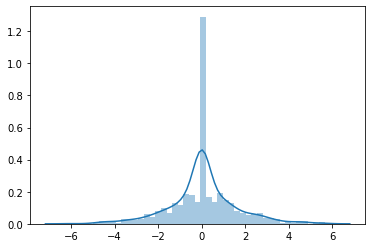

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

# Since >6M cells, random sample for efficiency
uvw_sample = np.random.choice(np.ndarray.flatten(uvw_raw), 10**3)
sns.distplot(uvw_sample)

## Normalize to pixels with 0-255 byte values

In [6]:
## Find min-max of u-v-w velocities
uvw_min = np.amin(uvw_raw)
uvw_max = np.amax(uvw_raw)
print('uvw_raw  min=', uvw_min, 'max=', uvw_max)

## Normalize and scale for RGB color using x_norm = 256*(X-uvw_min)/(uvw_max-uvw_min)
uvw_norm = (255 * (uvw_raw / (uvw_max-uvw_min) - (uvw_min/(uvw_max-uvw_min)))).astype(np.uint8)

print('uvw_norm type=', type(uvw_norm), type(uvw_norm[0,0,0,0]), 'shape=', uvw_norm.shape, ' # cells=', np.prod(uvw_norm.shape), 'sum=', uvw_norm.sum())

uvw_raw  min= -6.2111263 max= 6.2132716
uvw_norm type= <class 'numpy.ndarray'> <class 'numpy.uint8'> shape= (128, 128, 128, 3)  # cells= 6291456 sum= 804248128


## Create animated U-V-W GIF, each separately as raw and of u-v-w raw

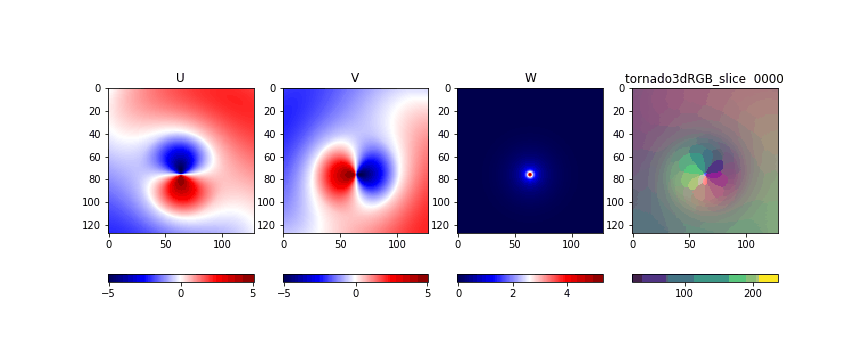

In [31]:
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
import glob
import imageio
from PIL import Image
#plt.ioff()  # when all the images are generated 
matplotlib.use('Agg')

# configuration
path = 'images/'
RGB_file = ds_name + '-RGB_slice '
anim_file = ds_name + '-RGB_slices.gif'

no_slices = uvw.shape[0]
for i in range(no_slices):
    U = uvw_raw[i,:,:,0]
    V = uvw_raw[i,:,:,1]
    W = uvw_raw[i,:,:,2]

    fig = plt.figure(figsize=(12,5))
    a = fig.add_subplot(1,4,1)
    plt.imshow(U, cmap='seismic')
    a.set_title('U')
    plt.colorbar(orientation='horizontal')

    a = fig.add_subplot(1,4,2)
    plt.imshow(V, cmap='seismic')
    a.set_title('V')
    plt.colorbar(orientation='horizontal')

    a = fig.add_subplot(1,4,3)
    plt.imshow(W, cmap='seismic')
    a.set_title('W')
    plt.colorbar(orientation='horizontal')
    
    a = fig.add_subplot(1,4,4)
    plt.imshow(uvw_norm[i,:,:,:])  #combines last dim into single RGB pixel
    rgb_title = RGB_file + ' {:04d}'.format(i)
    a.set_title(rgb_title)
    plt.colorbar(orientation='horizontal')

    plt.savefig(path + rgb_title)

##################################################################
# Generate animated GIF

with imageio.get_writer((path + anim_file), mode='I') as writer:
  filenames = glob.glob(path + RGB_file + '*.png')
  filenames = sorted(filenames)
  last = -1
  for i,filename in enumerate(filenames):
    image = imageio.imread(filename)
    writer.append_data(image)
    #writer.append_data(image)   #add extra frame to slow animation if needed
    os.remove(filename)          #comment out if jpg image to be retained
    
##################################################################
# Show animated GIF

from IPython.display import Image
Image(filename=path+anim_file)

## Create binary file with 3-byte binary tuples

First 3-byte tuple contains the three sizes for UVW 3D shape, followed by 3-byte tuples for each RGB24 pixel.

**Note** that the three bytes for shape currently allow for only zero to 255 as shape values.

In [9]:
# configuration
ext = ".uvw"
file_path = 'datasets/'
file_name = file_path + ds_name + ext

with open(file_name, "wb") as f:
    shape_bytes = np.array(uvw_norm.shape)[:3].astype(np.int8).tobytes()
    f.write(shape_bytes)
    
    uvw_bytes = uvw_norm.flatten().tobytes()
    f.write(uvw_bytes)
    
print('SENT: uvw_norm type=', type(uvw_norm), type(uvw_norm[0,0,0,0]), 'shape=', uvw_norm.shape, ' # cells=', np.prod(uvw_norm.shape), 'sum=', uvw_norm.sum())

SENT: uvw_norm type= <class 'numpy.ndarray'> <class 'numpy.uint8'> shape= (128, 128, 128, 3)  # cells= 6291456 sum= 804248128


In [10]:
################# test loading file

with open(file_name, "rb") as f:
    b = f.read(3)
    shape = tuple([b[0], b[1], b[2], 3])
    print(shape)
    uvw2 = np.zeros(shape).astype(np.uint8)
    
    for i in range(shape[0]):
        for j in range(shape[1]):
            for k in range(shape[2]):
                for l in range(3):
                    uvw2[i, j, k, l] = int.from_bytes(f.read(1), byteorder='big')
                    if uvw2[i, j, k, l] != uvw_norm[i, j, k, l]:
                        print(uvw2[i, j, k, l], uvw_norm[i, j, k, l])
    
print('RECEIVED: uvw type=', type(uvw2), type(uvw2[0,0,0,0]), 'shape=', uvw2.shape, ' # cells=', np.prod(uvw2.shape), 'sum=', uvw2.sum())

(128, 128, 128, 3)
RECEIVED: uvw type= <class 'numpy.ndarray'> <class 'numpy.uint8'> shape= (128, 128, 128, 3)  # cells= 6291456 sum= 804248128


## Show the distribution of initial U-V-W values

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib notebook

# Since >6M cells, random sample for efficiency
uvw_sample = np.random.choice(np.ndarray.flatten(uvw), 10**4)
uvw_sampleU = np.random.choice(np.ndarray.flatten(uvw[:,:,:,0]), 10**4)
uvw_sampleV = np.random.choice(np.ndarray.flatten(uvw[:,:,:,1]), 10**4)
uvw_sampleW = np.random.choice(np.ndarray.flatten(uvw[:,:,:,2]), 10**4)

sns.distplot(uvw_sample)

<IPython.core.display.Javascript object>

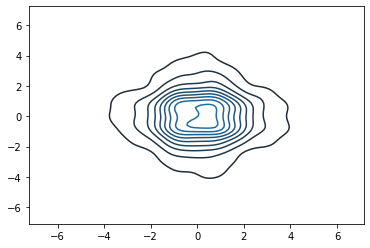

In [78]:
sns.kdeplot(uvw_sampleU, uvw_sampleV)

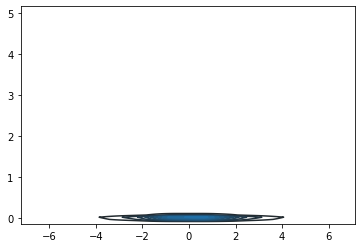

In [79]:
sns.kdeplot(uvw_sampleU, uvw_sampleW)

## Normalize and scale 255 for RGB color

using x_norm = 256*(X-uvw_min)/(uvw_max-uvw_min)

In [96]:
uvw_norm = (255 * (uvw / (uvw_max-uvw_min) - (uvw_min/(uvw_max-uvw_min)))).astype(np.uint8)
uvw_norm[:2,:2,:2,:]

array([[[[125,  87, 127],
         [126,  87, 127]],

        [[125,  87, 127],
         [126,  87, 127]]],


       [[[123,  88, 127],
         [124,  87, 127]],

        [[124,  87, 127],
         [125,  87, 127]]]], dtype=uint8)

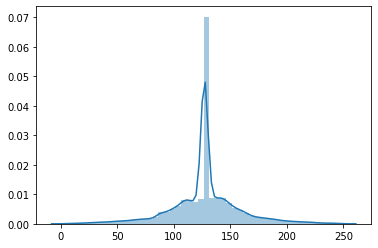

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Since >6M cells, random sample for efficiency
uvw_sample = np.random.choice(np.ndarray.flatten(uvw_norm), 10**4)
sns.distplot(uvw_sample)

## Save UVW_norm to /Data 

In [16]:
file_name = "../Data/tornado3d_norm.npy"  # add timestamp in future
np.save(file_name, uvw_norm)  #### interesting... NPY file is same size as orginal NC file

### uvw_norm = np.load(file_name)    # uncomment when needed

In [3]:
import IPython
if IPython.version_info >= (6,2,0,''):
    #display.Image(filename=anim_file)
    display(filename = path + anim_file)